In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import pandas as pd
# import itertools

from matplotlib.lines import Line2D
import matplotlib.cm  as cm
import matplotlib.animation as animation
from matplotlib.animation import FuncAnimation
import matplotlib.gridspec as gridspec
from IPython.display import HTML
%matplotlib inline

In [37]:
from matplotlib.colors import LinearSegmentedColormap
import matplotlib.cm  as cm

def custom_cmap(color_list):
    """
        custom_cmap(color_list)
    It creates a color map from a list of colors Returns a colormap.
    Be careful with non-monochromatic cmaps.
    E.g.
        mycmap = custom_cmap(['blue', 'cyan', '#f0f0f0'])
    """
    return LinearSegmentedColormap.from_list('mycmap', color_list)

def plot_field2(field, n_t):
    
#     %%capture
    cmap = custom_cmap(['blue', 'red'])

    fig,ax = plt.subplots(figsize=(10,6.5),
                          subplot_kw={'projection': ccrs.PlateCarree()})

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='black', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    ax.set_extent([-49.5, -48, -28.5,-25.5], crs=ccrs.PlateCarree())
# [-73.0, 24.916666,-60.916664, -5]
    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)

    ax.add_feature(cfeature.BORDERS, linestyle=':')
#     ax.pcolormesh(X,Y, background_field,zorder=0,vmax=10)
#     ax.pcolormesh(X,Y, coast)

    scatter = ax.scatter(field['lon'].values[:, n_t],
                         field['lat'].values[:, n_t],
                     s=10, c=field['beach'].values[:, n_t], cmap=cmap)

    title = ax.set_title(f'Particle age = {0} hours')

def plot_animation2(field, n_t):

    cmap = custom_cmap(['blue', 'red'])
    fig,ax = plt.subplots(figsize=(10,6.5),
                          subplot_kw={'projection': ccrs.PlateCarree()})

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='black', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    ax.set_extent([-49.5, -48, -28.5,-25.5], crs=ccrs.PlateCarree())

    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)

    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.pcolormesh(X, Y, coast, zorder=0)

    scatter = ax.scatter(field['lon'].values[:, 0],
                         field['lat'].values[:, 0],
                     s=10, c=field['beach'].values[:, 0], cmap=cmap)

    title = ax.set_title(f'Particle age = {0} hours')

    def animate_age(i):
        title.set_text(f'Particle age = {i} hours')


        scatter.set_offsets(np.c_[field['lon'].values[:, i],
                                  field['lat'].values[:, i]])
        
        scatter.set_array(field['beach'].values[:, i])


    anim = FuncAnimation(fig, animate_age, frames = n_t, interval=500)
    plt.close()
    return anim

def plot_animation3(field, n_t):

    cmap = custom_cmap(['blue', 'red'])
    fig,ax = plt.subplots(figsize=(10,6.5),
                          subplot_kw={'projection': ccrs.PlateCarree()})

    gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                      linewidth=1, color='black', alpha=0.3, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False

    ax.set_extent([-73.0, 24.916666,-60.916664, -5], crs=ccrs.PlateCarree())

    #ax.add_feature(cfeature.OCEAN)
    ax.add_feature(cfeature.LAND)
    ax.add_feature(cfeature.COASTLINE)

    ax.add_feature(cfeature.BORDERS, linestyle=':')
    ax.pcolormesh(X, Y, coast, zorder=0)

    scatter = ax.scatter(field['lon'].values[:, 0],
                         field['lat'].values[:, 0],
                     s=10, c=field['beach'].values[:, 0], cmap=cmap)

    title = ax.set_title(f'Particle age = {0} hours')

    def animate_age(i):
        title.set_text(f'Particle age = {i} hours')


        scatter.set_offsets(np.c_[field['lon'].values[:, i],
                                  field['lat'].values[:, i]])
        
        scatter.set_array(field['beach'].values[:, i])


    anim = FuncAnimation(fig, animate_age, frames = n_t, interval=500)
    plt.close()
    return anim

# Gemini test


In [8]:
g1 = xr.load_dataset(f"../data/simulations/debug_test/br-cr_Itajai_D1600_N100000.nc")

In [9]:
g1

<xarray.Dataset>
Dimensions:     (obs: 307, traj: 83889)
Dimensions without coordinates: obs, traj
Data variables:
    trajectory  (traj, obs) float64 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan nan
    time        (traj, obs) datetime64[ns] 2016-04-12T12:00:00 ... NaT
    lat         (traj, obs) float32 -26.94 -26.92 -27.06 -27.18 ... nan nan nan
    lon         (traj, obs) float32 -48.5 -48.6 -48.55 -48.45 ... nan nan nan
    z           (traj, obs) float32 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan nan
    beach       (traj, obs) float32 0.0 0.0 0.0 0.0 0.0 ... nan nan nan nan nan
    age         (traj, obs) float32 3.6e+04 1.224e+05 2.088e+05 ... nan nan nan
    distance    (traj, obs) float32 18.21 7.379 11.71 17.56 ... nan nan nan nan
Attributes:
    feature_type:           trajectory
    Conventions:            CF-1.6/CF-1.7
    ncei_template_version:  NCEI_NetCDF_Trajectory_Template_v2.0
    parcels_version:        2.2.1.dev292+gc6c2d7bb
    parcels_mesh:           spherical

In [34]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=30, metadata=dict(artist='Claudio'), bitrate=3000)

In [33]:
anim_g1_zoom = plot_animation2(g1, 305)
HTML(anim_g1_zoom.to_jshtml())

In [35]:
anim_g1_zoom.save('anim_g1_zoom.mp4', writer=writer, dpi=100)

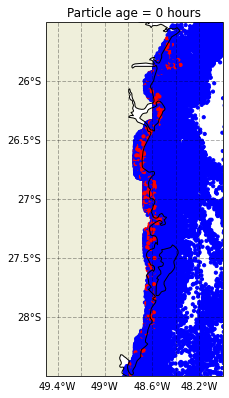

In [16]:
plot_field2(g1, 10)

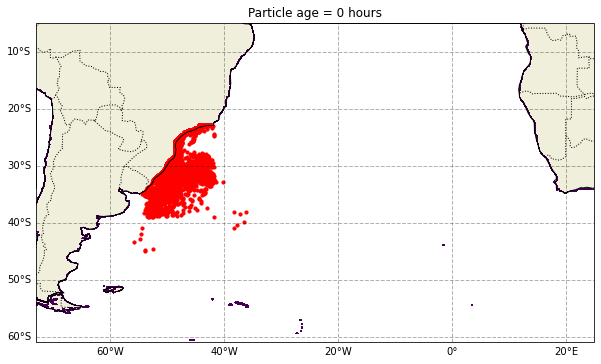

In [23]:
plot_field(g1, coast, 100)

In [38]:
anim_g1 = plot_animation3(g1, 305)
anim_g1.save('anim_g1.mp4', writer=writer, dpi=100)

In [ ]:
# Set up formatting for the movie files
Writer = animation.writers['ffmpeg']
writer = Writer(fps=30, metadata=dict(artist='Claudio'), bitrate=3000)

anim_g1.save('g1_large.mp4', writer=writer, dpi=100)

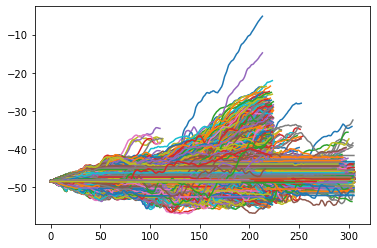

In [24]:
plt.plot(g1['lon'][:,:].T);

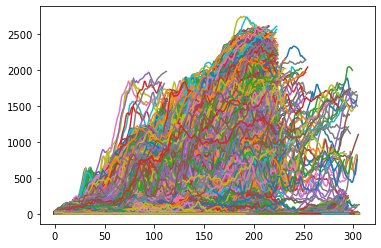

In [25]:
plt.plot(g1['distance'][:,:].T);